In [1]:
#importing libraries
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib
import os

In [2]:
matplotlib.__version__

'3.7.2'

In [3]:
%matplotlib inline

In [9]:
#creating path
path = 'C:/Users/logan/Downloads/CareerFoundry/NBA Stats'

In [13]:
#loading data
df = pd.read_csv(os.path.join(path, '02 Data', 'Prepared Data', 'final nba stats set csv.csv'))

In [16]:
#checking data
df.shape

(12844, 28)

In [18]:
df.head(100)

,player_id,season,player,team_abbreviation,State,age,player_height,player_weight,college,country,...,oreb_pct,dreb_pct,usg_pct,ts_pct,ast_pct,MVP,Championship,Playoffs,position,experience
0,419,1997,A.C. Green,DAL,Texas,33,205.74,102.058200,Oregon State,USA,...,0.100,0.207,0.119,0.523,0.045,False,False,False,PF,12
1,667,1998,A.C. Green,DAL,Texas,34,205.74,102.058200,Oregon State,USA,...,0.090,0.196,0.118,0.496,0.074,False,False,False,PF,13
2,1006,1999,A.C. Green,DAL,Texas,35,205.74,102.058200,Oregon State,USA,...,0.097,0.179,0.148,0.441,0.043,False,False,False,PF,14
3,9331,2000,A.C. Green,LAL,California,36,205.74,102.058200,Oregon State,USA,...,0.089,0.179,0.111,0.482,0.058,False,True,True,PF,15
4,11196,2001,A.C. Green,MIA,Florida,37,205.74,102.058200,Oregon State,USA,...,0.089,0.171,0.141,0.492,0.050,False,False,True,PF,16
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,9139,2010,Adam Morrison,LAL,California,25,203.20,92.986360,Gonzaga,USA,...,0.044,0.101,0.183,0.418,0.121,False,True,True,SF,3
96,11961,2022,Ade Murkey,SAC,California,24,195.58,90.718400,Denver,USA,...,0.000,0.000,0.000,0.000,0.000,False,False,False,SG,1
97,10847,2020,Admiral Schofield,WAS,District of Columbia,23,195.58,109.315672,Tennessee,United Kingdom,...,0.017,0.106,0.118,0.502,0.057,False,False,False,PF,1
98,11962,2022,Admiral Schofield,ORL,Florida,25,195.58,109.315672,Tennessee,United Kingdom,...,0.033,0.146,0.143,0.538,0.084,False,False,False,SF,2


In [19]:
df.columns

Index(['player_id', 'season', 'player', 'team_abbreviation', 'State', 'age',
       'player_height', 'player_weight', 'college', 'country', 'draft_year',
       'draft_round', 'draft_number', 'gp', 'pts', 'reb', 'ast', 'net_rating',
       'oreb_pct', 'dreb_pct', 'usg_pct', 'ts_pct', 'ast_pct', 'MVP',
       'Championship', 'Playoffs', 'position', 'experience'],
      dtype='object')

In [20]:
df.isnull().sum()

player_id               0
season                  0
player                  0
team_abbreviation       0
State                   0
age                     0
player_height           0
player_weight           0
college              1854
country                 0
draft_year              0
draft_round             0
draft_number            0
gp                      0
pts                     0
reb                     0
ast                     0
net_rating              0
oreb_pct                0
dreb_pct                0
usg_pct                 0
ts_pct                  0
ast_pct                 0
MVP                     0
Championship            0
Playoffs                0
position                0
experience              0
dtype: int64

In [22]:
#dropping column
df_dups = df[df.duplicated()]

In [24]:
df_dups.shape

(0, 28)

In [26]:
df.drop(columns=['college'], inplace=True)

In [29]:
for col in df.columns.tolist():
      weird = (df[[col]].map(type) != df[[col]].iloc[0].apply(type)).any(axis = 1)
      if len (df[weird]) > 0:
        print (col)

In [30]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12844 entries, 0 to 12843
Data columns (total 27 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   player_id          12844 non-null  int64  
 1   season             12844 non-null  int64  
 2   player             12844 non-null  object 
 3   team_abbreviation  12844 non-null  object 
 4   State              12844 non-null  object 
 5   age                12844 non-null  int64  
 6   player_height      12844 non-null  float64
 7   player_weight      12844 non-null  float64
 8   country            12844 non-null  object 
 9   draft_year         12844 non-null  object 
 10  draft_round        12844 non-null  object 
 11  draft_number       12844 non-null  object 
 12  gp                 12844 non-null  int64  
 13  pts                12844 non-null  float64
 14  reb                12844 non-null  float64
 15  ast                12844 non-null  float64
 16  net_rating         128

In [48]:
#creating df for numeric variables
subset_df = df[['player_height', 'player_weight', 'experience', 'age', 'pts', 'reb', 'ast', 'oreb_pct', 'dreb_pct', 'ts_pct', 'ast_pct', 'net_rating']]

In [49]:
#checking subset
subset_df.head()

,player_height,player_weight,experience,age,pts,reb,ast,oreb_pct,dreb_pct,ts_pct,ast_pct,net_rating
0,205.74,102.0582,12,33,7.2,7.9,0.8,0.100,0.207,0.523,0.045,-8.0
1,205.74,102.0582,13,34,7.3,8.1,1.5,0.090,0.196,0.496,0.074,-7.2
2,205.74,102.0582,14,35,4.9,4.6,0.5,0.097,0.179,0.441,0.043,-5.6
3,205.74,102.0582,15,36,5.0,5.9,1.0,0.089,0.179,0.482,0.058,8.1
4,205.74,102.0582,16,37,4.5,3.8,0.5,0.089,0.171,0.492,0.050,3.3


In [50]:
#creating correlation table
subset_df.corr()

,player_height,player_weight,experience,age,pts,reb,ast,oreb_pct,dreb_pct,ts_pct,ast_pct,net_rating
player_height,1.000000,0.822141,0.030445,-0.007904,-0.055284,0.424220,-0.442781,0.589538,0.614273,0.076797,-0.608696,-0.003074
player_weight,0.822141,1.000000,0.096654,0.063561,-0.025023,0.438112,-0.371675,0.599511,0.605639,0.070992,-0.521939,0.003547
experience,0.030445,0.096654,1.000000,0.892031,0.183238,0.177828,0.194918,-0.058490,0.076303,0.093088,0.105579,0.121576
age,-0.007904,0.063561,0.892031,1.000000,0.011353,0.037386,0.092359,-0.055228,0.018774,0.025245,0.069029,0.092896
pts,-0.055284,-0.025023,0.183238,0.011353,1.000000,0.624509,0.664320,-0.125164,0.055669,0.373439,0.337339,0.215199
reb,0.424220,0.438112,0.177828,0.037386,0.624509,1.000000,0.247841,0.407960,0.611899,0.313451,-0.062654,0.187820
ast,-0.442781,-0.371675,0.194918,0.092359,0.664320,0.247841,1.000000,-0.337970,-0.192146,0.174494,0.803150,0.162865
oreb_pct,0.589538,0.599511,-0.058490,-0.055228,-0.125164,0.407960,-0.337970,1.000000,0.555358,0.060572,-0.424056,0.055761
dreb_pct,0.614273,0.605639,0.076303,0.018774,0.055669,0.611899,-0.192146,0.555358,1.000000,0.105150,-0.317477,0.047928
ts_pct,0.076797,0.070992,0.093088,0.025245,0.373439,0.313451,0.174494,0.060572,0.105150,1.000000,0.022195,0.313251


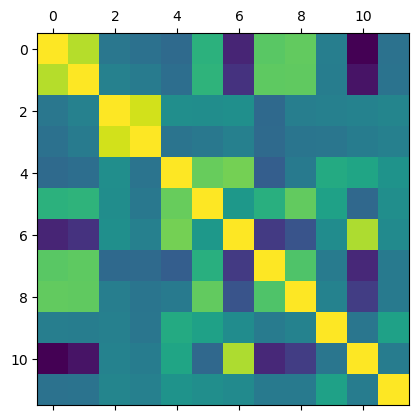

In [52]:
#creating a correlation heatmap using matplotlib

plt.matshow(subset_df.corr())
plt.show()

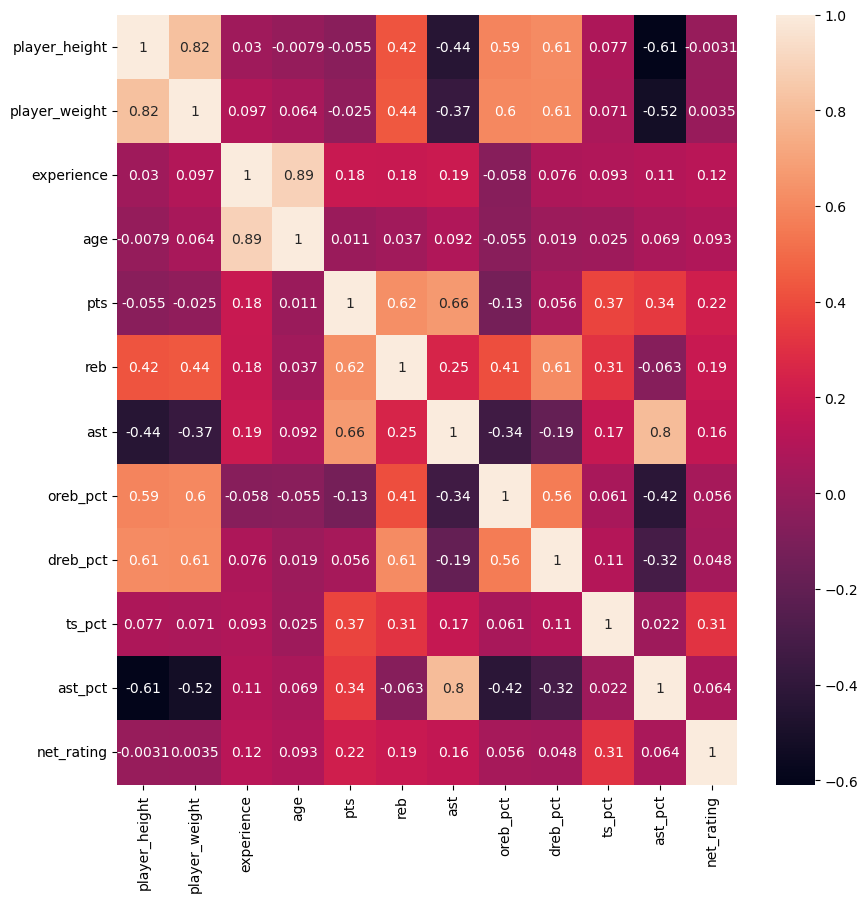

In [51]:
#creating subplot
f,ax = plt.subplots(figsize=(10,10))

#Creating matrix heatmap
corr = sns.heatmap(subset_df.corr(), annot = True, ax = ax)

## Question 3

### Certain aspects of the heat map will be correlated, such as height and weight, experience and age, and the corresponding stats with height (taller people rebound more while shorter players get more assists). But we do see a slight correlation between true shooting % and net rating. (The more efficient a player shoots, the better he is for the team on the court) 

C:\Users\logan\anaconda3\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


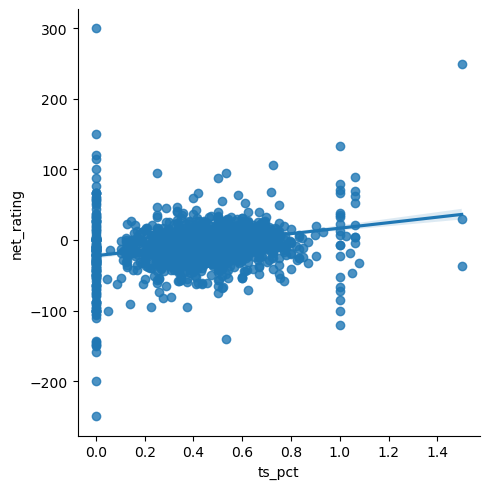

In [54]:
#scatterplots of most correlated objective-related data
sns.lmplot(x = 'ts_pct', y = 'net_rating', data = df)

C:\Users\logan\anaconda3\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


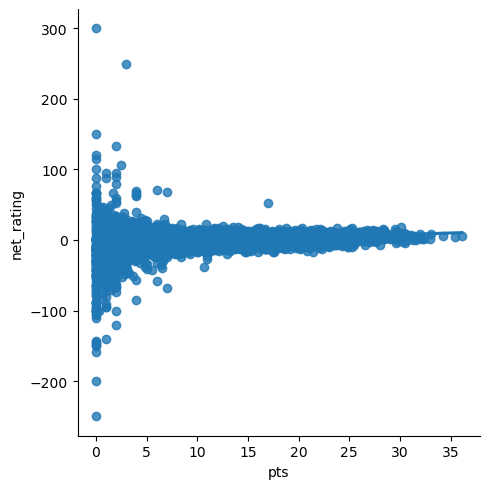

In [57]:
sns.lmplot(x = 'pts', y = 'net_rating', data = df)

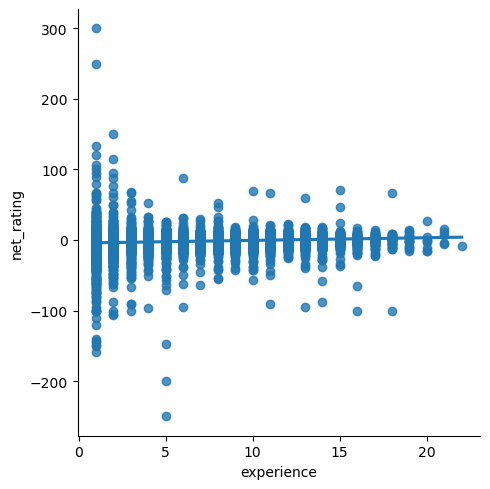

In [69]:
sns.lmplot(x = 'experience', y = 'net_rating', data = df)

# Question 4

### We can see the slight correlations, but will need to cut out the few outliers to get a better look. With the outliers being in 1 experience (rookie), it would seem these numbers get skewed in such a tiny sample size

C:\Users\logan\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\logan\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\logan\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\logan\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_cat

C:\Users\logan\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\logan\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\logan\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\logan\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.

C:\Users\logan\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\logan\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\logan\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\logan\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_cat

C:\Users\logan\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\logan\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\logan\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\logan\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_cat

C:\Users\logan\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\logan\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\logan\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\logan\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_cat

C:\Users\logan\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\logan\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\logan\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\logan\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_cat

C:\Users\logan\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\logan\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\logan\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\logan\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_cat

C:\Users\logan\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\logan\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\logan\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\logan\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_cat

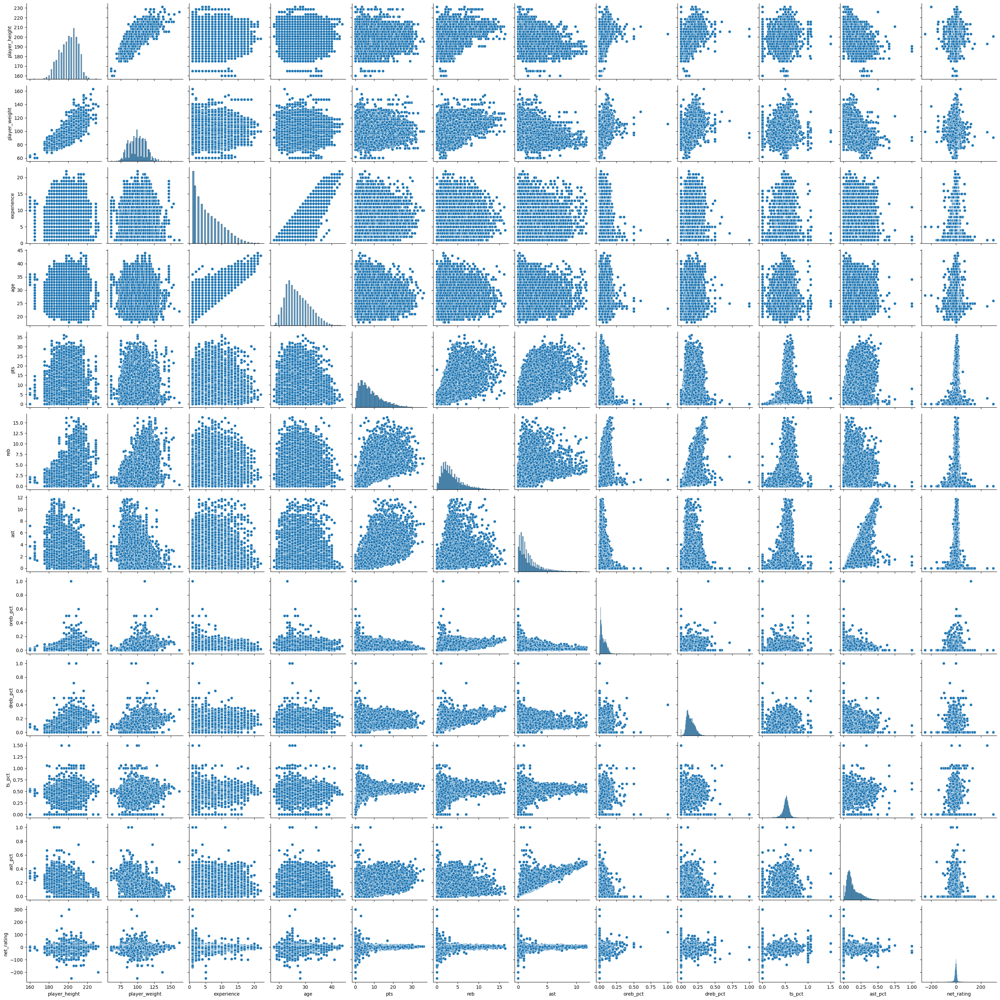

In [63]:
#creating a pairplot
pair_plot = sns.pairplot(subset_df)

In [64]:
import warnings

# Ignore all warnings
warnings.filterwarnings("ignore")

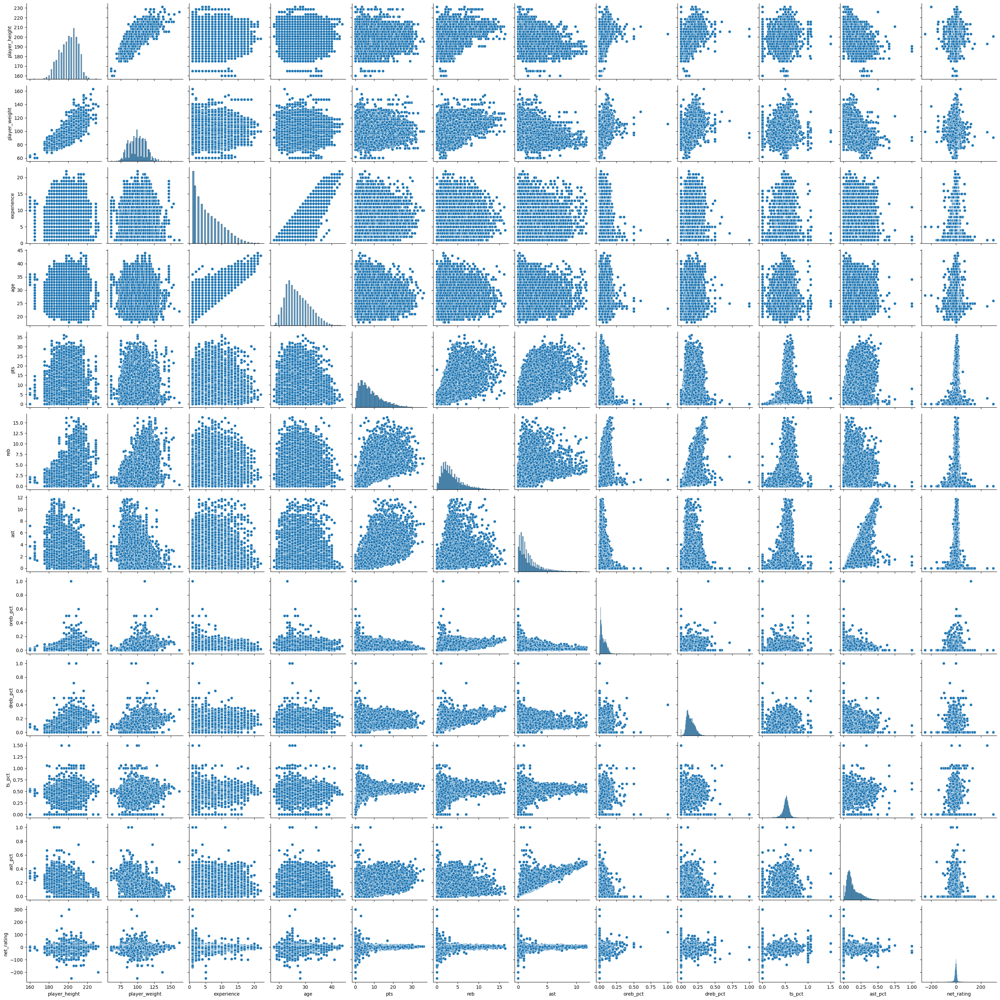

In [65]:
#creating a pairplot
pair_plot = sns.pairplot(subset_df)

# Question 6

### to do a better job of analyzing, I'd like to drop some of the outliers, which I feel really mess up this graph. Maybe players within a certain net rating And players who played more than 20 games to prevent charts from being so grouped around the mean. We can see in the bottom right of the pairplot, how it's so concentrated around 0, but goes beyond 200 in both directions.

In [71]:
subset_df['net_rating'].value_counts()

net_rating
-0.3      87
 0.8      87
-1.9      85
-1.4      83
 0.1      81
          ..
-71.1      1
-38.9      1
-40.8      1
-48.1      1
-106.8     1
Name: count, Length: 772, dtype: int64

In [76]:
subset_df['net_rating'].describe()

count    12844.000000
mean        -2.226339
std         12.665124
min       -250.000000
25%         -6.400000
50%         -1.300000
75%          3.200000
max        300.000000
Name: net_rating, dtype: float64

In [107]:
#filtering out players less than 15 games
filtered_df = df[df['gp'] >= 15]

In [108]:
filtered_df.shape

(11182, 27)

### That droppped about 1000 rows. Let's see if that helped

In [109]:
filtered_subset_df = filtered_df[['player_height', 'player_weight', 'experience', 'age', 'pts', 'reb', 'ast', 'oreb_pct', 'dreb_pct', 'ts_pct', 'ast_pct', 'net_rating']]

In [110]:
filtered_subset_df['net_rating'].describe()

count    11182.000000
mean        -1.271794
std          6.703018
min        -54.500000
25%         -5.500000
50%         -1.000000
75%          3.200000
max         27.400000
Name: net_rating, dtype: float64

### That had a significant impact on min and max. Let's go through the same charts and see how it looks

In [111]:
#creating correlation table
filtered_subset_df.corr()

,player_height,player_weight,experience,age,pts,reb,ast,oreb_pct,dreb_pct,ts_pct,ast_pct,net_rating
player_height,1.000000,0.824233,0.019805,-0.010425,-0.068521,0.461236,-0.474727,0.670681,0.695683,0.121455,-0.647003,0.005264
player_weight,0.824233,1.000000,0.089083,0.063883,-0.041627,0.472169,-0.405086,0.685926,0.689769,0.110090,-0.561992,0.021885
experience,0.019805,0.089083,1.000000,0.898154,0.149124,0.143746,0.173116,-0.067220,0.075713,0.069009,0.108302,0.198256
age,-0.010425,0.063883,0.898154,1.000000,-0.011510,0.017439,0.082395,-0.061281,0.020817,0.016527,0.072433,0.171233
pts,-0.068521,-0.041627,0.149124,-0.011510,1.000000,0.579358,0.641471,-0.162233,0.042396,0.390202,0.365109,0.284588
reb,0.461236,0.472169,0.143746,0.017439,0.579358,1.000000,0.183218,0.486853,0.702925,0.340034,-0.097356,0.246444
ast,-0.474727,-0.405086,0.173116,0.082395,0.641471,0.183218,1.000000,-0.406196,-0.247175,0.143313,0.865923,0.220438
oreb_pct,0.670681,0.685926,-0.067220,-0.061281,-0.162233,0.486853,-0.406196,1.000000,0.720465,0.085403,-0.505328,0.021223
dreb_pct,0.695683,0.689769,0.075713,0.020817,0.042396,0.702925,-0.247175,0.720465,1.000000,0.145761,-0.385717,0.056598
ts_pct,0.121455,0.110090,0.069009,0.016527,0.390202,0.340034,0.143313,0.085403,0.145761,1.000000,-0.036101,0.360078


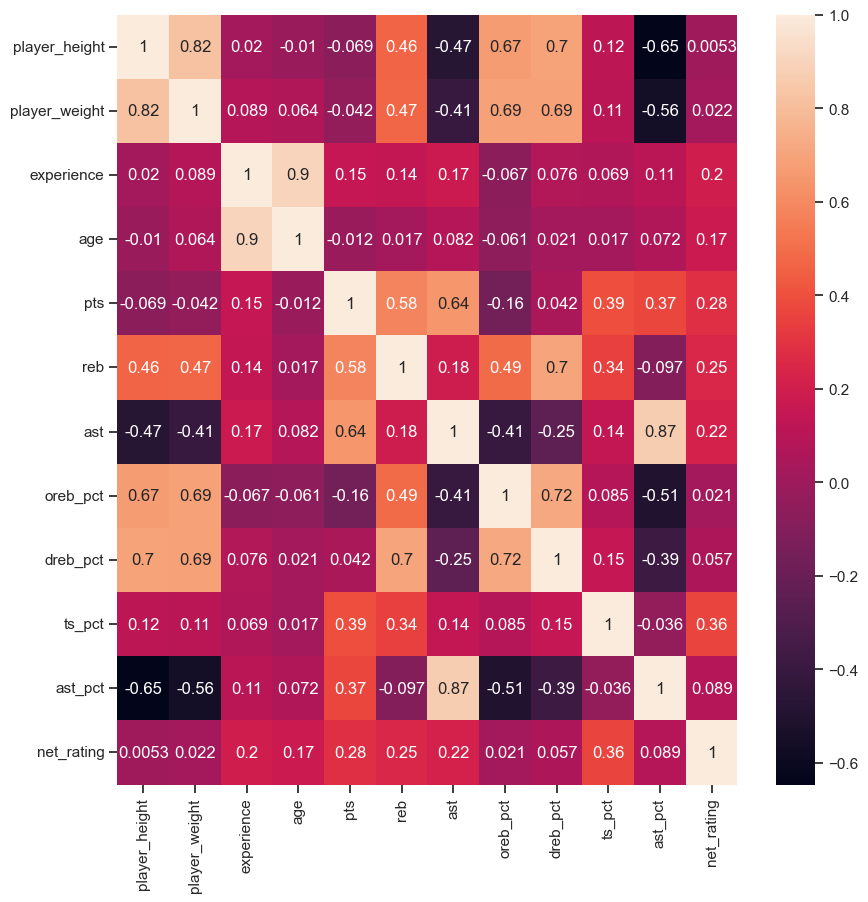

In [112]:
#creating subplot
f,ax = plt.subplots(figsize=(10,10))

#Creating matrix heatmap
corr = sns.heatmap(filtered_subset_df.corr(), annot = True, ax = ax)

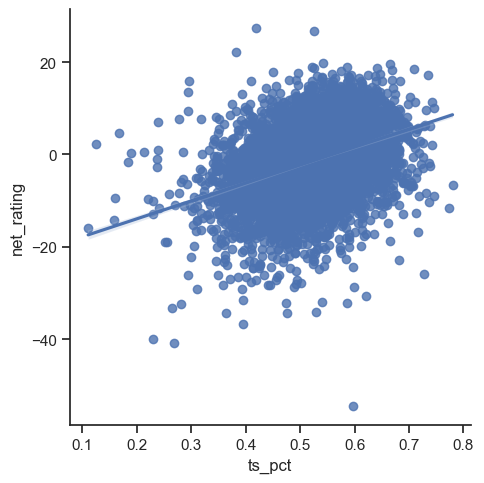

In [113]:
sns.lmplot(x = 'ts_pct', y = 'net_rating', data = filtered_df)

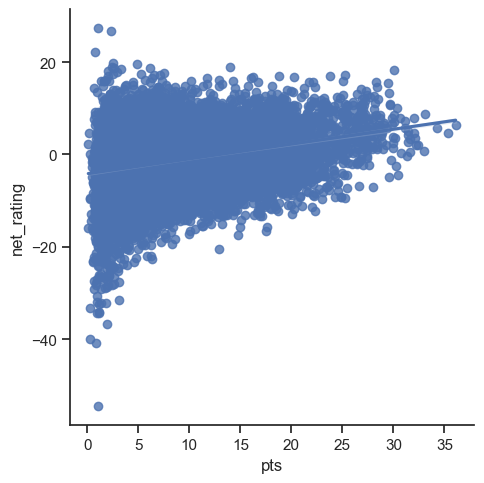

In [114]:
sns.lmplot(x = 'pts', y = 'net_rating', data = filtered_df)

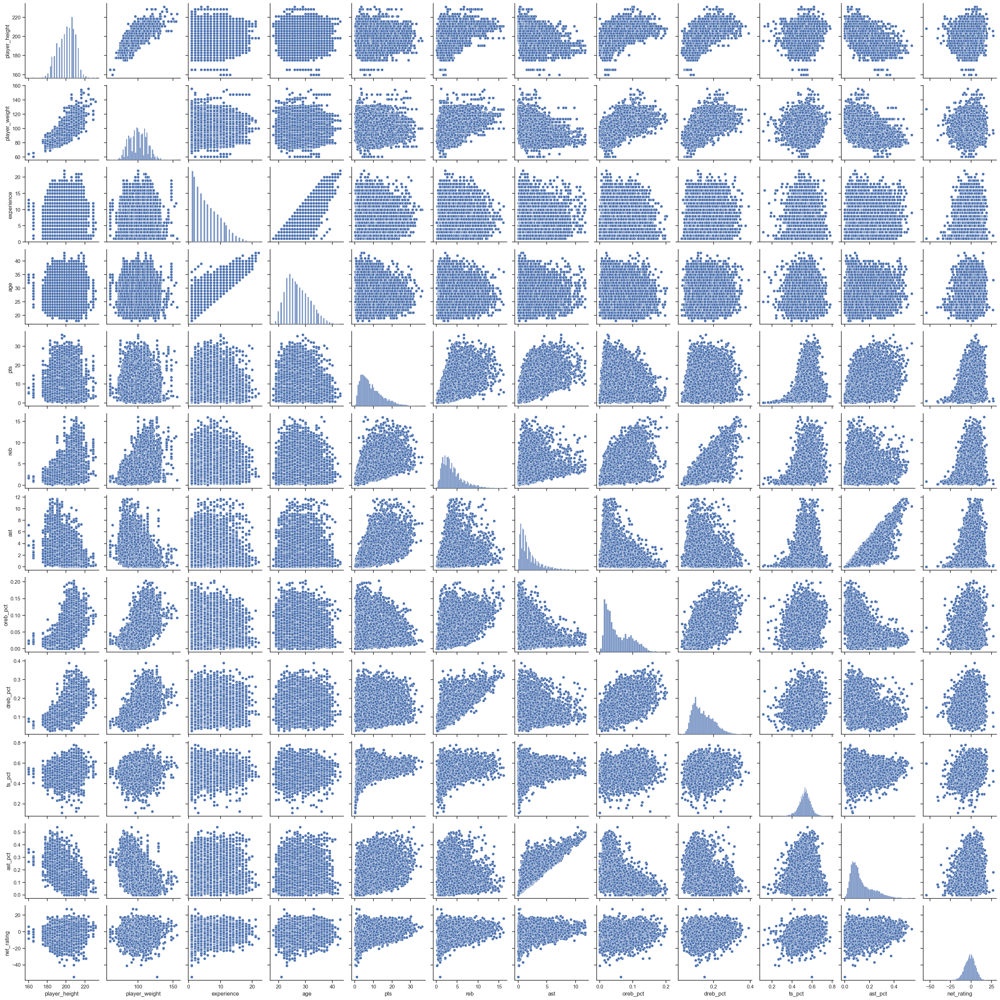

In [115]:
#creating a pairplot
pair_plot = sns.pairplot(filtered_subset_df)

### It certainly looks a lot better and we can see the trendline better. I'll do more of these in a further analysis to look into chracteristics of the MVP, playoff teams, and championship teams over the years.

In [116]:
#creating efficiency categories
filtered_df.loc[filtered_df['net_rating'] > 3.2, 'Impact level'] = 'Very Positive'

In [117]:
filtered_df.loc[(filtered_df['net_rating'] <= 3.2) & (df['net_rating'] >= 0), 'Impact level'] = 'Positive'

In [118]:
filtered_df.loc[(filtered_df['net_rating'] < 0) & (df['net_rating'] >= -5.5), 'Impact level'] = 'Negative'

In [119]:
filtered_df.loc[filtered_df['net_rating'] <-4.8, 'Impact level'] = 'Very Negative'

In [120]:
filtered_df['Impact level'].value_counts()

Impact level
Very Negative    3142
Negative         3075
Very Positive    2755
Positive         2210
Name: count, dtype: int64

<Axes: xlabel='net_rating', ylabel='Count'>

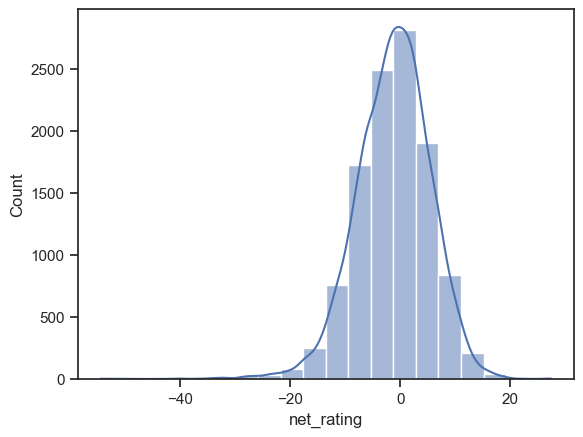

In [123]:
sns.histplot(filtered_df['net_rating'], bins = 20, kde = True)

### The kind of distribution makes sense since for every time a player has a positive play, it's a negative on their opponent.

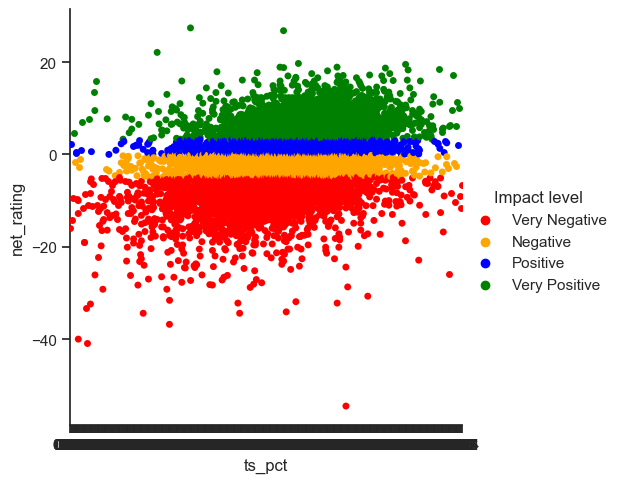

In [124]:
# Define the desired order of categories and corresponding colors
impact_level_order = ["Very Negative", "Negative", "Positive", "Very Positive"]
custom_palette = {"Very Negative": "red", "Negative": "orange", "Positive": "blue", "Very Positive": "green"}

# Set the style
sns.set(style="ticks")

# Create the catplot with specified hue order and custom palette
g = sns.catplot(x="ts_pct", y="net_rating", hue="Impact level", hue_order=impact_level_order, palette=custom_palette, data=filtered_df)

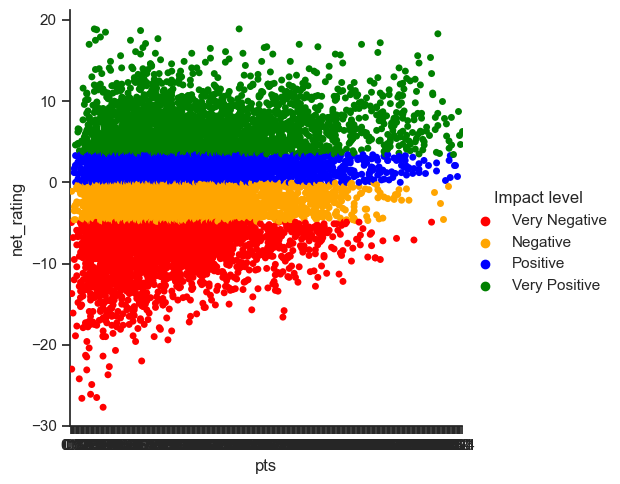

In [106]:
impact_level_order = ["Very Negative", "Negative", "Positive", "Very Positive"]
custom_palette = {"Very Negative": "red", "Negative": "orange", "Positive": "blue", "Very Positive": "green"}

sns.set(style="ticks")

# Create the catplot with specified hue order and custom palette
g = sns.catplot(x="pts", y="net_rating", hue="Impact level", hue_order=impact_level_order, palette=custom_palette, data=filtered_df)

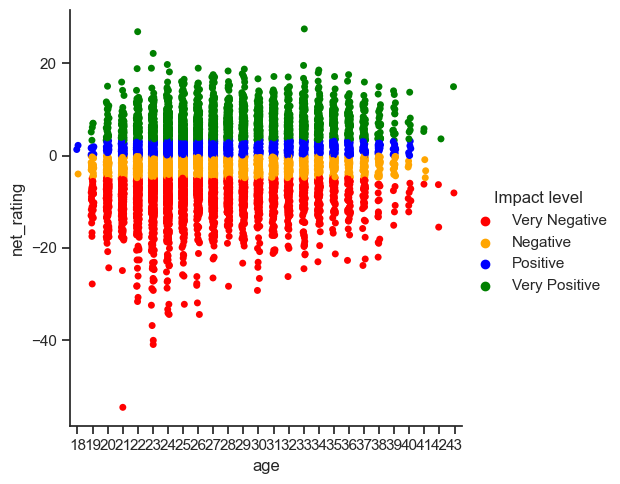

In [125]:
impact_level_order = ["Very Negative", "Negative", "Positive", "Very Positive"]
custom_palette = {"Very Negative": "red", "Negative": "orange", "Positive": "blue", "Very Positive": "green"}

sns.set(style="ticks")

# Create the catplot with specified hue order and custom palette
g = sns.catplot(x="age", y="net_rating", hue="Impact level", hue_order=impact_level_order, palette=custom_palette, data=filtered_df)

# Question 6

### I looked at a few different variables but didn't see any distinct patterns. Perhaps on a deeper analysis, we'll see what happens when we add playoffs, total games played, etc.

# Question 7

### One of the qustions was "What stats play into career longevity?" but from what we've tested so far, there's nothing correlated with age. Perhaps if we filter past the age 35 we can find certain stats that are higher for older players. Most of the other questions weren't tested in the work we did in this exercise.

In [ ]:
|